In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

import pandas as pd
import geopandas as gpd
import contextily as ctx

import os
data_pth = "../Data/"

In [2]:
# GeoPandas comes with some data, like countries of the world
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

In [3]:
# Check the coordinate reference system (crs) of the data
world.crs

{'init': 'epsg:4326'}

In [4]:
# Spatial data has both a spatial component and a tabular component. Check out the
# first few rows of the tabular component
world.head()

,pop_est,continent,name,iso_a3,gdp_md_est,geometry
0,920938,Oceania,Fiji,FJI,8374.0,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
1,53950935,Africa,Tanzania,TZA,150600.0,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982..."
2,603253,Africa,W. Sahara,ESH,906.5,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,35623680,North America,Canada,CAN,1674000.0,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742..."
4,326625791,North America,United States of America,USA,18560000.0,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000..."


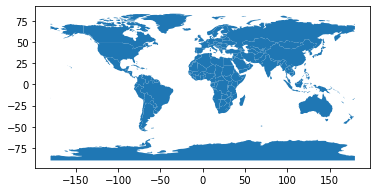

In [5]:
# View the spatial component of the data using default styles
world.plot()

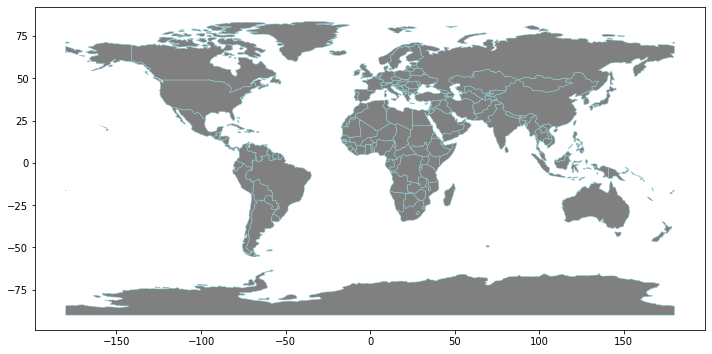

In [6]:
# You'll usually want to customize how your map looks
# Note colors can be defined by word, or by hex code https://www.color-hex.com/
world.plot(color='grey', linewidth=0.5, edgecolor='#8ad0d6', figsize=(12,10))

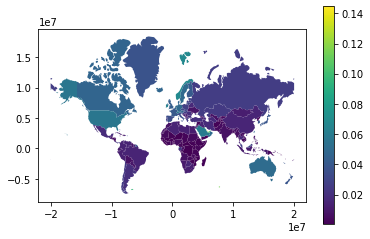

In [39]:
# Whether you know it or not, you've probably seen a choropleth map before
# These are maps where the color of each polygon is based on the value of some attribute

# From the geopandas documentation: https://geopandas.org/mapping.html
# We can use attribute information seen before to create one with a few lines of code

world = world[(world.pop_est>0) & (world.name!="Antarctica")]
world['gdp_per_cap'] = world.gdp_md_est / world.pop_est
world.plot(column='gdp_per_cap', legend=True)

In [8]:
# GeoPandas also comes with city data, but its just the capital cities, so I'll load in my own
cities = gpd.read_file(os.path.join(data_pth, "ne_10m_populated_places.shp"))

In [9]:
cities.crs

{'init': 'epsg:4326'}

In [10]:
cities.head()

,NAME,ADM0NAME,POP,geometry
0,Colonia del Sacramento,Uruguay,21714,POINT (-57.84000 -34.48000)
1,Trinidad,Uruguay,21093,POINT (-56.90100 -33.54400)
2,Fray Bentos,Uruguay,23279,POINT (-58.30400 -33.13900)
3,Canelones,Uruguay,19698,POINT (-56.28400 -34.53800)
4,Florida,Uruguay,32234,POINT (-56.21500 -34.09900)


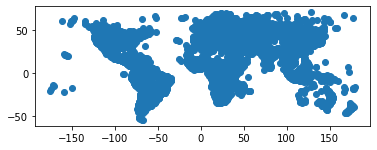

In [11]:
cities.plot()

In [12]:
# We are in Pittsburgh, so let's find that in our data and assign it to a variable
Pittsburgh = cities.loc[cities['NAME'] == 'Pittsburgh']

In [13]:
# View the first few rows of the tabular component of the new Pittsburgh geodataframe
# Your code here:

In [14]:
# View the spatial component of the new Pittsburgh geodataframe
# Your code here:

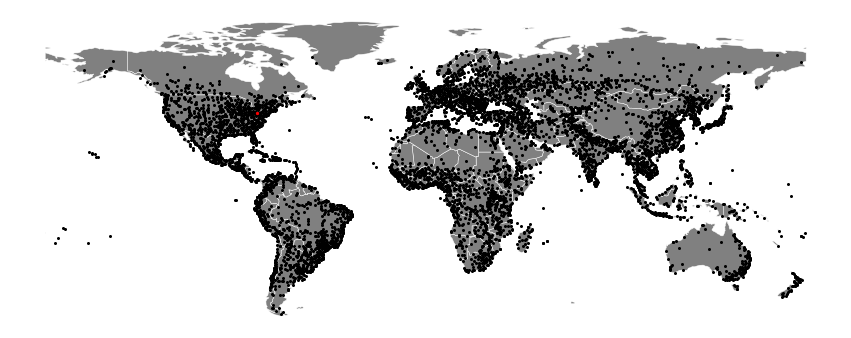

In [15]:
# To show multiple layers on the same plot, create a variable of the base level plot, then set ax equal to that variable
# for any layers you want shown on top of it. Layers are drawn in the order in which you plot them, or you can manually
# specify order with zorder. 
base = world.plot(color='grey', linewidth=0.5, edgecolor='white', figsize=(15,10), zorder = 1)
cities.plot(ax=base, color='black', markersize=4, zorder = 2)
Pittsburgh.plot(ax=base, color='red', markersize=5, zorder =3)
base.set_axis_off()

In [16]:
# We have found the Pittsburgh city boundary from the Western Pennsylvania Regional Data Center, let's pull it in
Pitts_citybndry = gpd.read_file(os.path.join(data_pth, "Pittsburgh_City_Boundary.shp"))

In [17]:
Pitts_citybndry.crs

{'init': 'epsg:4326'}

In [18]:
Pitts_citybndry.head()

,OBJECTID,AREA,PERIMETER,BOUNDARY_,BOUNDARY_I,Shape_Leng,geometry
0,1,2.390814e+08,80995.806272,2,3,80995.807740,"POLYGON ((-80.05148 40.48350, -80.04982 40.484..."
1,2,7.809345e+06,13583.073713,3,4,13583.073648,"POLYGON ((-79.90150 40.48744, -79.90155 40.488..."
2,3,6.633454e+08,136797.979285,4,1,136797.978549,"POLYGON ((-79.88404 40.48246, -79.88417 40.481..."
3,4,6.426495e+06,13292.970311,5,5,13292.970433,"POLYGON ((-80.04105 40.46395, -80.04080 40.463..."
4,5,2.125020e+06,8998.423032,6,6,8998.422498,"POLYGON ((-79.97453 40.46628, -79.97462 40.466..."


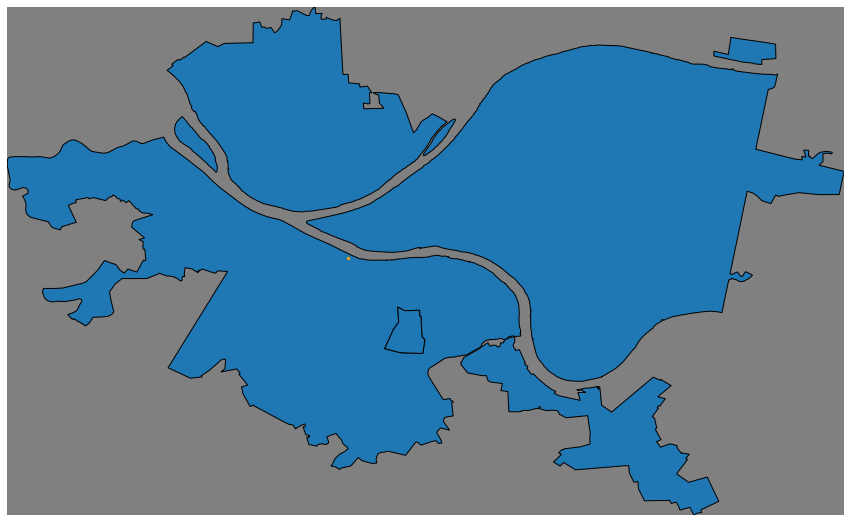

In [19]:
base = world.plot(color='grey', linewidth=0.5, edgecolor='white', figsize=(15,10))
Pitts_citybndry.plot(ax=base, edgecolor='black')
Pittsburgh.plot(ax=base, color='orange', markersize=5)

bounds = Pitts_citybndry.geometry.bounds
plt.xlim([bounds.minx.min(), bounds.maxx.max()])
plt.ylim([bounds.miny.min(), bounds.maxy.max()])
base.set_axis_off()

In [20]:
# There are some places we want to visit while in town, let's manually create a geodataframe to hold them.

#First create a dataframe with 3 columns: Name, Latitude, and Longitude
POI_df = pd.DataFrame(
    {'Name': ['David L. Lawrence Convention Center', 
              'Phipps Conservatory',
              'Carnegie Museum of Natural History', 
              'Carnegie Science Center', 
              'Cathedral of Learning',
              'Frick Art and Historical Center',
              'Duquesne Incline',
              'Pittsburgh Zoo & PPG Aquarium',
              'Strip District',
              'Point State Park',
              'Andy Warhol Museum',
              'Carnegie Museum of Art'],
     'Latitude': [40.4458, 40.4392, 40.4434, 40.4456, 40.4443, 40.4475, 40.4399, 40.4832, 40.4534, 40.4416, 40.4484, 40.4437],
     'Longitude': [-79.9962, -79.9474, -79.9507, -80.0182, -79.9532, -79.9018, -80.0176, -79.9213, -79.9807, -80.0079, -80.0025, -79.9490]})

# Then we'll convert the dataframe to a geodataframe by creating a spatial component with the latitude and longitude columns
POI_gdf = gpd.GeoDataFrame(
    POI_df, geometry=gpd.points_from_xy(POI_df.Longitude, POI_df.Latitude))

# Finally we need to define the coordinate reference system
POI_gdf.crs = {'init': 'epsg:4326'}

In [21]:
POI_gdf.crs

{'init': 'epsg:4326'}

In [22]:
POI_gdf.head()

,Name,Latitude,Longitude,geometry
0,David L. Lawrence Convention Center,40.4458,-79.9962,POINT (-79.99620 40.44580)
1,Phipps Conservatory,40.4392,-79.9474,POINT (-79.94740 40.43920)
2,Carnegie Museum of Natural History,40.4434,-79.9507,POINT (-79.95070 40.44340)
3,Carnegie Science Center,40.4456,-80.0182,POINT (-80.01820 40.44560)
4,Cathedral of Learning,40.4443,-79.9532,POINT (-79.95320 40.44430)


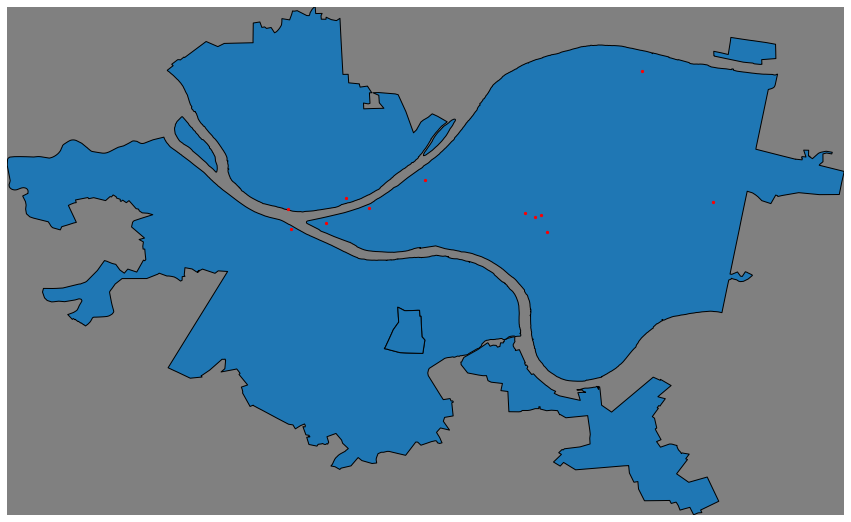

In [23]:
# Let's plot the data we've just created and zoom in on it
base = world.plot(color='grey', linewidth=0.5, edgecolor='white', figsize=(15,10))
Pitts_citybndry.plot(ax=base, edgecolor='black')
POI_gdf.plot(ax=base, color='red', markersize=5)

bounds = Pitts_citybndry.geometry.bounds
plt.xlim([bounds.minx.min(), bounds.maxx.max()])
plt.ylim([bounds.miny.min(), bounds.maxy.max()])
base.set_axis_off()

In [24]:
# We can make this map a lot prettier by using some pre-made Open Source basemap tiles from http://maps.stamen.com/
# But the basemap tiles are in another coordinate reference system (Web Mercator/epsg 3857)
# Let's re-project our geodataframes into this one

world = world.to_crs(epsg=3857)
cities = cities.to_crs(epsg=3857)
Pitts_citybndry = Pitts_citybndry.to_crs(epsg=3857)
Pittsburgh = Pittsburgh.to_crs(epsg=3857)
POI_gdf = POI_gdf.to_crs(epsg=3857)

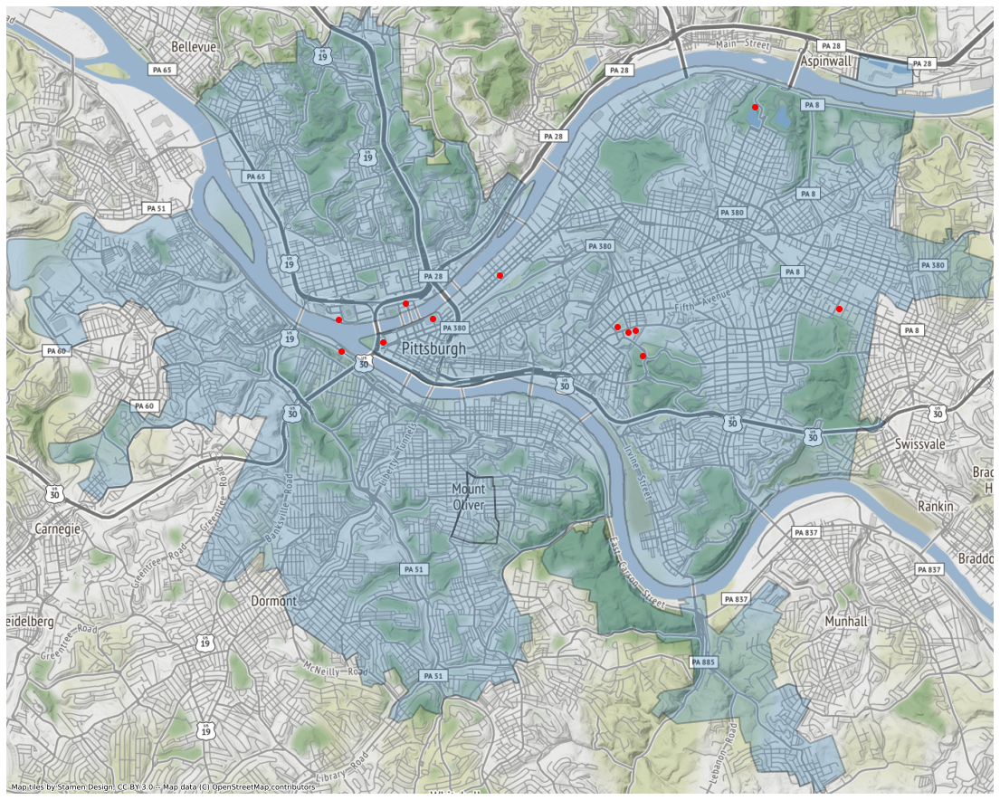

In [25]:
# Now we can use the basemaps

fig, ax = plt.subplots(figsize = (20,16)) 

Pitts_citybndry.plot(edgecolor='black', alpha = 0.25, linewidth = 2, ax=ax)
ctx.add_basemap(ax,url=ctx.providers.Stamen.Terrain)

POI_gdf.plot(ax=ax,color='red')
bounds = Pitts_citybndry.geometry.bounds

#for x, y, label in zip(POI_gdf.geometry.x, POI_gdf.geometry.y, POI_gdf.Name):
#    ax.annotate(label, xy=(x, y), xytext=(3, 3), textcoords="offset points")

plt.xlim([bounds.minx.min(), bounds.maxx.max()])
plt.ylim([bounds.miny.min(), bounds.maxy.max()])
ax.set_axis_off()

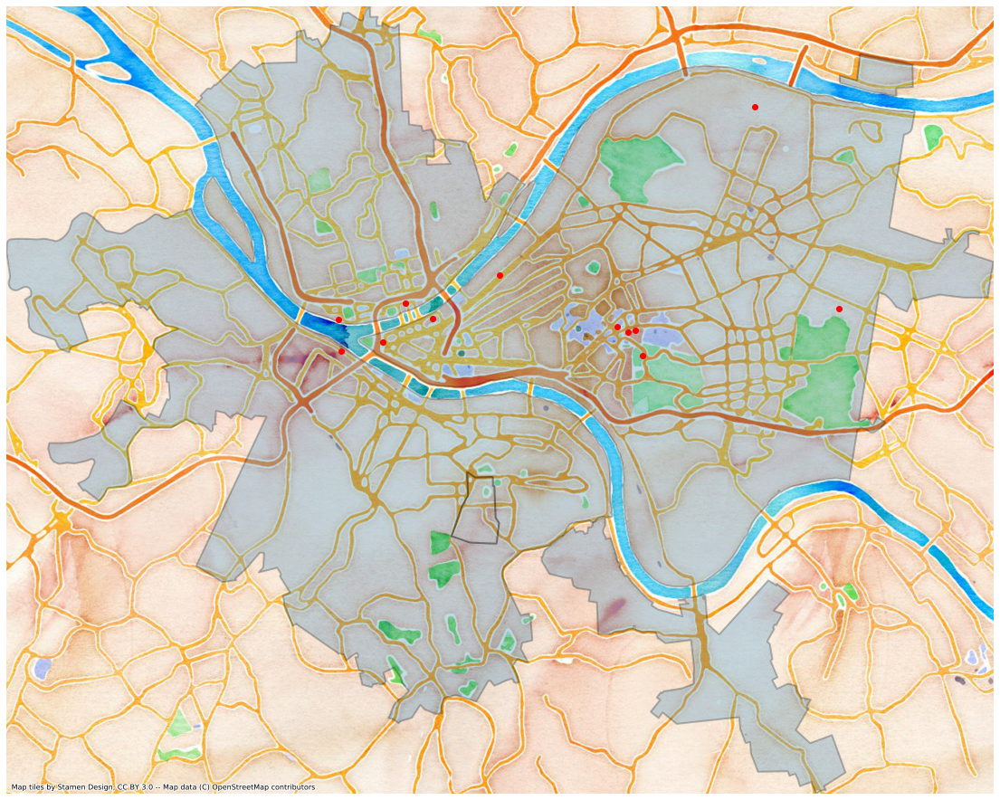

In [26]:
fig, ax = plt.subplots(figsize = (20,16)) 

Pitts_citybndry.plot(edgecolor='black', alpha = 0.25, linewidth = 2, ax=ax)
ctx.add_basemap(ax,url=ctx.providers.Stamen.Watercolor)

POI_gdf.plot(ax=ax,color='red')
bounds = Pitts_citybndry.geometry.bounds

plt.xlim([bounds.minx.min(), bounds.maxx.max()])
plt.ylim([bounds.miny.min(), bounds.maxy.max()])
ax.set_axis_off()

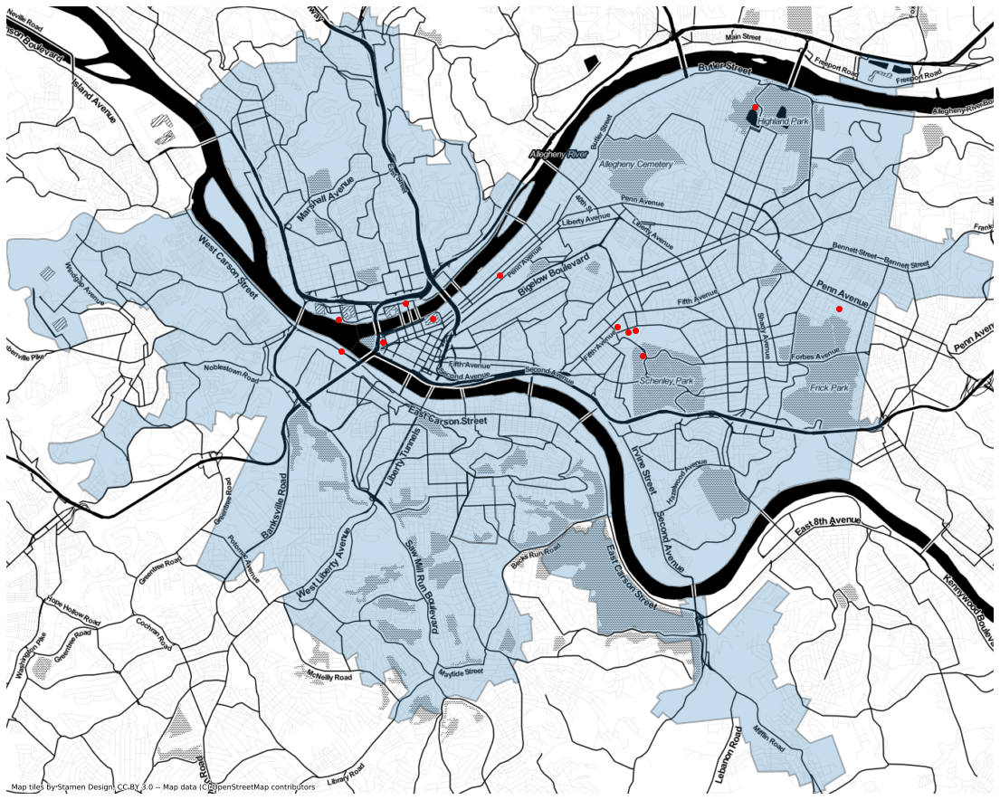

In [27]:
fig, ax = plt.subplots(figsize = (20,16)) 

Pitts_citybndry.plot(edgecolor='black', alpha = 0.25, linewidth = 2, ax=ax)
ctx.add_basemap(ax,url=ctx.providers.Stamen.Toner)

POI_gdf.plot(ax=ax,color='red')
bounds = Pitts_citybndry.geometry.bounds

plt.xlim([bounds.minx.min(), bounds.maxx.max()])
plt.ylim([bounds.miny.min(), bounds.maxy.max()])
ax.set_axis_off()

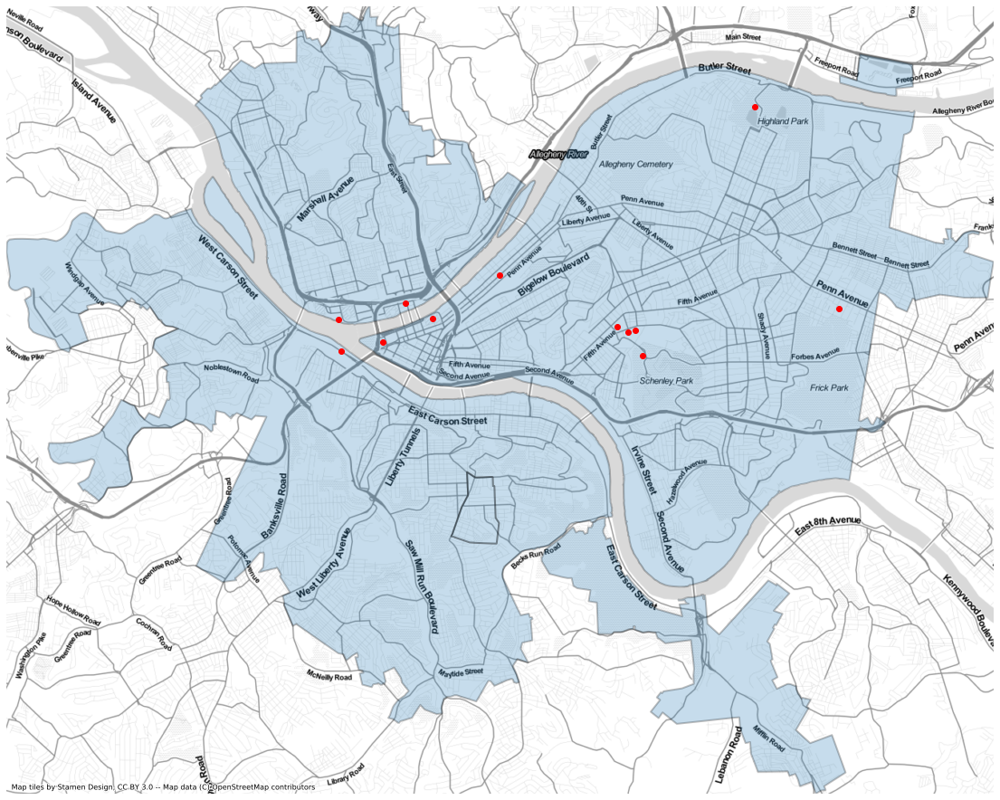

In [28]:
fig, ax = plt.subplots(figsize = (20,16)) 

Pitts_citybndry.plot(edgecolor='black', alpha = 0.25, linewidth = 2, ax=ax)
ctx.add_basemap(ax,url=ctx.providers.Stamen.TonerLite)

POI_gdf.plot(ax=ax,color='red')
bounds = Pitts_citybndry.geometry.bounds

plt.xlim([bounds.minx.min(), bounds.maxx.max()])
plt.ylim([bounds.miny.min(), bounds.maxy.max()])
ax.set_axis_off()

In [29]:
# Use this data to make a map using the styling of your choice
# Your code here:



In [30]:
# Let's put the convention center in its own geodataframe so we can use it to measure from
Conv_center = POI_gdf[POI_gdf.Name == 'David L. Lawrence Convention Center']

In [31]:
Conv_center.head()

,Name,Latitude,Longitude,geometry
0,David L. Lawrence Convention Center,40.4458,-79.9962,POINT (-8905136.249 4930937.779)


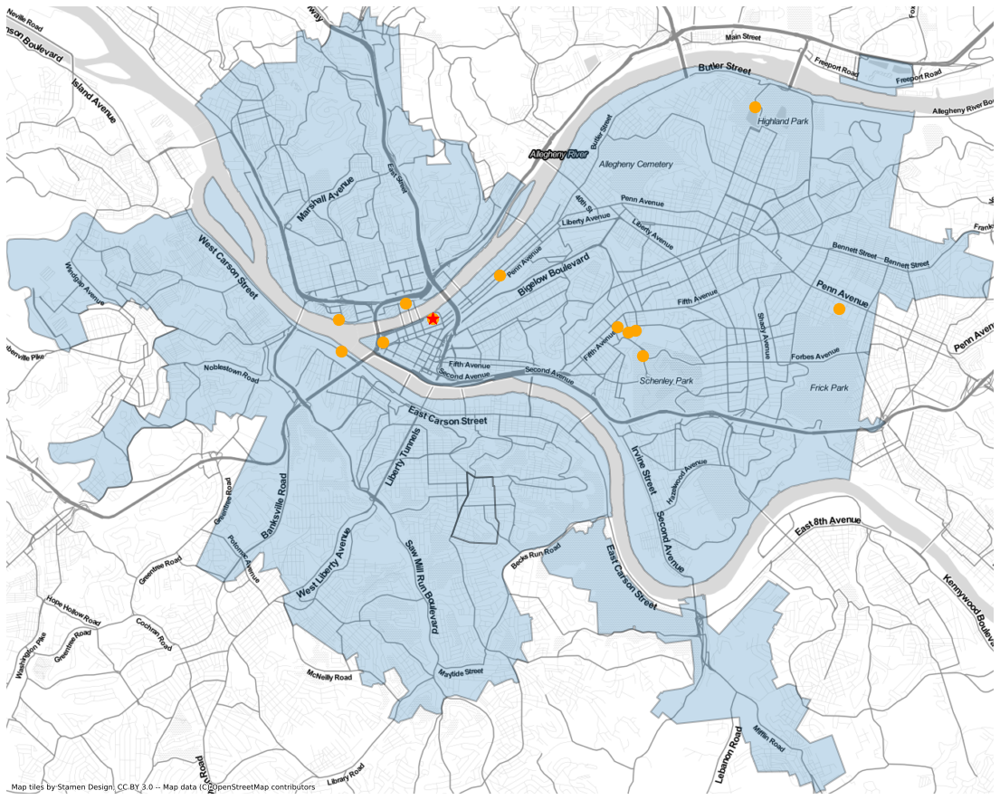

In [32]:
# Add the convention center to the map with a different style

fig, ax = plt.subplots(figsize = (20,16)) 

Pitts_citybndry.plot(edgecolor='black', alpha = 0.25, linewidth = 2, ax=ax)
ctx.add_basemap(ax,url=ctx.providers.Stamen.TonerLite)

POI_gdf.plot(ax=ax,color='orange', markersize = 150)
Conv_center.plot(ax=ax,color='red', marker = '*', markersize = 200)
bounds = Pitts_citybndry.geometry.bounds

plt.xlim([bounds.minx.min(), bounds.maxx.max()])
plt.ylim([bounds.miny.min(), bounds.maxy.max()])
ax.set_axis_off()

In [33]:
# Create a function that calulates the distance between the convention center and all of our POI
# Our crs unit is meters, so we'll add a calculation to get it in miles
def calc_distance(Conv_center, POI_gdf):
    return POI_gdf.distance(Conv_center)* 0.00062137

POI_gdf['dist_from_conv_cent_miles'] = POI_gdf.geometry.apply(calc_distance, args=(Conv_center,))

In [34]:
# And view the results
POI_gdf.sort_values(by ='dist_from_conv_cent_miles')

,Name,Latitude,Longitude,geometry,dist_from_conv_cent_miles
0,David L. Lawrence Convention Center,40.4458,-79.9962,POINT (-8905136.249 4930937.779),0.000000
10,Andy Warhol Museum,40.4484,-80.0025,POINT (-8905837.562 4931318.106),0.495730
9,Point State Park,40.4416,-80.0079,POINT (-8906438.687 4930323.436),0.894808
8,Strip District,40.4534,-79.9807,POINT (-8903410.797 4932049.545),1.275430
3,Carnegie Science Center,40.4456,-80.0182,POINT (-8907585.278 4930908.524),1.521862
6,Duquesne Incline,40.4399,-80.0176,POINT (-8907518.486 4930074.785),1.574387
4,Cathedral of Learning,40.4443,-79.9532,POINT (-8900349.511 4930718.367),2.977458
2,Carnegie Museum of Natural History,40.4434,-79.9507,POINT (-8900071.213 4930586.721),3.154812
11,Carnegie Museum of Art,40.4437,-79.9490,POINT (-8899881.969 4930630.603),3.270427
1,Phipps Conservatory,40.4392,-79.9474,POINT (-8899703.858 4929972.400),3.428410


In [35]:
# Let's create a series of buffers around the convention center
buf_1m = Conv_center.buffer(1609.34, resolution=16)
buf_2m = Conv_center.buffer(3218.69, resolution=16)
buf_3m = Conv_center.buffer(4828.03, resolution=16)
buf_5m = Conv_center.buffer(8046.72, resolution=16)
buf_7m = Conv_center.buffer(11265.4, resolution=16)

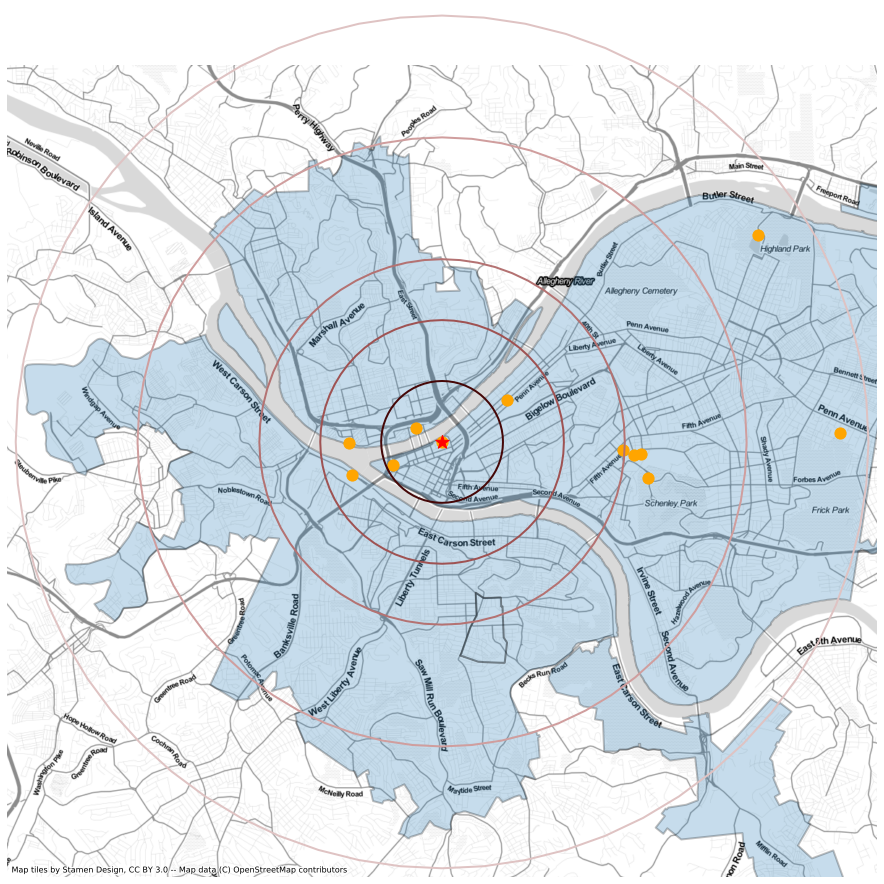

In [36]:
# Add the buffers to the map with customized styles

fig, ax = plt.subplots(figsize = (20,16)) 

Pitts_citybndry.plot(edgecolor='black', alpha = 0.25, linewidth = 2, ax=ax)
ctx.add_basemap(ax,url=ctx.providers.Stamen.TonerLite)

POI_gdf.plot(ax=ax, color='orange', markersize = 125)
Conv_center.plot(ax=ax,color='red', marker = '*', markersize = 200)
buf_1m.plot(ax=ax, facecolor="none", edgecolor='#450707', linewidth = 2)
buf_2m.plot(ax=ax, facecolor="none", edgecolor='#9f5252', linewidth = 2)
buf_3m.plot(ax=ax, facecolor="none", edgecolor='#b47272', linewidth = 2)
buf_5m.plot(ax=ax, facecolor="none", edgecolor='#d09e9e', linewidth = 2)
buf_7m.plot(ax=ax, facecolor="none", edgecolor='#dfc3c3', linewidth = 2)

bounds = buf_7m.geometry.bounds

plt.xlim([bounds.minx.min()-225, bounds.maxx.max()+225])
plt.ylim([bounds.miny.min()-225, bounds.maxy.max()+225])
ax.set_axis_off()

#plt.savefig('..//data//Pittsburgh_map.png', bbox_inches='tight',dpi=300)

In [37]:
# Customize your own map and save it as an image
# Your code here:


# Uncomment this when your map is ready
#plt.savefig('..//data//Pittsburgh_map.png', bbox_inches='tight',dpi=300)